In [9]:
import mrmr
import pandas as pd
from mrmr import mrmr_classif
import pickle


In [10]:
gene_expression_data = pd.read_csv("gene_expr_label.csv", index_col=0)

In [11]:
X = gene_expression_data.drop(columns=['state'])
y = gene_expression_data['state']
selected_features = mrmr_classif(X=X, y=y, K=100)

100%|██████████| 100/100 [1:54:35<00:00, 68.76s/it]    


In [12]:
import pickle

with open('probe_genes.pkl', 'rb') as f:
    probe_genes = pickle.load(f)

In [13]:
selected_features

['216829_at',
 '222343_at',
 '1563320_at',
 '230012_at',
 '209309_at',
 '225822_at',
 '217148_x_at',
 '235524_at',
 '225275_at',
 '202207_at',
 '214777_at',
 '204153_s_at',
 '1561151_a_at',
 '231131_at',
 '227648_at',
 '230499_at',
 '214768_x_at',
 '205942_s_at',
 '225536_at',
 '217892_s_at',
 '217239_x_at',
 '216984_x_at',
 '240436_at',
 '213131_at',
 '216401_x_at',
 '238417_at',
 '217235_x_at',
 '218500_at',
 '225080_at',
 '203199_s_at',
 '217384_x_at',
 '210538_s_at',
 '217342_x_at',
 '205159_at',
 '216576_x_at',
 '1564154_at',
 '1565282_at',
 '203271_s_at',
 '216542_x_at',
 '226882_x_at',
 '216560_x_at',
 '223838_at',
 '220169_at',
 '234764_x_at',
 '1567656_at',
 '214427_at',
 '1561937_x_at',
 '210448_s_at',
 '204065_at',
 '216557_x_at',
 '210587_at',
 '208534_s_at',
 '216412_x_at',
 '226488_at',
 '202643_s_at',
 '241647_x_at',
 '234366_x_at',
 '218552_at',
 '202508_s_at',
 '203695_s_at',
 '229491_at',
 '234884_x_at',
 '215311_at',
 '35617_at',
 '1564130_x_at',
 '216573_at',
 '2277

In [14]:
intersezione = list(set(probe_genes) & set(selected_features))

In [15]:
len(intersezione)

9

# Nostri 100 geni

In [16]:
from sklearn.model_selection import train_test_split
X = X[selected_features]
# Splitting the data into training and temporary sets (70% train, 30% temp)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

# Splitting the temporary set into validation and test sets (50% validation, 50% test)
X_validation, X_test, y_validation, y_test = train_test_split(X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=42)

from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score

# Initializing the decision tree classifier
clf = DecisionTreeClassifier(random_state=42)
# Training the classifier
clf.fit(X_train, y_train)

# Making predictions on the validation set
y_pred_validation = clf.predict(X_validation)

# Evaluating the model
print("Validation Set Performance:")
print(classification_report(y_validation, y_pred_validation))

Validation Set Performance:
              precision    recall  f1-score   support

           0       0.90      0.90      0.90        48
           1       0.17      0.17      0.17         6

    accuracy                           0.81        54
   macro avg       0.53      0.53      0.53        54
weighted avg       0.81      0.81      0.81        54



In [17]:
# Generate confusion matrix

from sklearn.metrics import confusion_matrix

print(confusion_matrix(y_validation, y_pred_validation))

[[43  5]
 [ 5  1]]


In [26]:
# Trying with a SVM

from sklearn.svm import SVC

clf = SVC(kernel='linear', C=100)
clf.fit(X_train, y_train)

y_pred_validation = clf.predict(X_validation)

print(classification_report(y_validation, y_pred_validation))
print(confusion_matrix(y_validation, y_pred_validation))

              precision    recall  f1-score   support

           0       0.95      0.88      0.91        48
           1       0.40      0.67      0.50         6

    accuracy                           0.85        54
   macro avg       0.68      0.77      0.71        54
weighted avg       0.89      0.85      0.87        54

[[42  6]
 [ 2  4]]


# 36 geni ricercatori

In [27]:
from sklearn.model_selection import train_test_split
X = X = gene_expression_data.drop(columns=['state'])[probe_genes]
# Splitting the data into training and temporary sets (70% train, 30% temp)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

# Splitting the temporary set into validation and test sets (50% validation, 50% test)
X_validation, X_test, y_validation, y_test = train_test_split(X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=42)

from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score

# Initializing the decision tree classifier
clf = DecisionTreeClassifier(random_state=42)
# Training the classifier
clf.fit(X_train, y_train)

# Making predictions on the validation set
y_pred_validation = clf.predict(X_validation)

# Evaluating the model
print("Validation Set Performance:")
print(classification_report(y_validation, y_pred_validation))

Validation Set Performance:
              precision    recall  f1-score   support

           0       0.94      0.92      0.93        48
           1       0.43      0.50      0.46         6

    accuracy                           0.87        54
   macro avg       0.68      0.71      0.69        54
weighted avg       0.88      0.87      0.87        54



In [29]:
from sklearn.metrics import confusion_matrix

print(confusion_matrix(y_validation, y_pred_validation))

[[44  4]
 [ 3  3]]


In [31]:

from sklearn.svm import SVC

clf = SVC(kernel='linear', C=100)
clf.fit(X_train, y_train)

y_pred_validation = clf.predict(X_validation)

print(classification_report(y_validation, y_pred_validation))
print(confusion_matrix(y_validation, y_pred_validation))

              precision    recall  f1-score   support

           0       0.94      0.92      0.93        48
           1       0.43      0.50      0.46         6

    accuracy                           0.87        54
   macro avg       0.68      0.71      0.69        54
weighted avg       0.88      0.87      0.87        54

[[44  4]
 [ 3  3]]


In [ ]:
len(selected_features)

100

In [33]:
with open("mrmr_selected_genes.txt", "w") as file:
    # Write each gene to the file
    for gene in selected_features:
        file.write(gene + "\n")

In [ ]:
X

,1053_at,117_at,121_at,1255_g_at,1294_at,1316_at,1320_at,1405_i_at,1431_at,1438_at,...,AFFX-r2-Ec-bioD-3_at,AFFX-r2-Ec-bioD-5_at,AFFX-r2-P1-cre-3_at,AFFX-r2-P1-cre-5_at,AFFX-ThrX-3_at,AFFX-ThrX-5_at,AFFX-ThrX-M_at,AFFX-TrpnX-3_at,AFFX-TrpnX-5_at,AFFX-TrpnX-M_at
1007_s_at,,,,,,,,,,,,,,,,,,,,,
1.573956,1.358708,1.467337,1.682516,0.901045,1.566870,1.378121,1.314857,1.367516,1.203722,1.478375,...,1.827632,1.781068,1.884390,1.911549,1.237442,1.163814,1.008850,0.863384,0.979565,1.003787
1.501270,1.266687,1.441489,1.697444,0.898466,1.512690,1.404902,1.308036,1.186132,1.184976,1.508569,...,1.745982,1.695292,1.853015,1.860822,1.225456,1.131216,1.033660,0.827768,0.946664,0.991057
1.572295,1.403879,1.475055,1.678755,0.943835,1.602569,1.397244,1.276248,1.386097,1.209603,1.443532,...,1.855169,1.803324,1.910143,1.919126,1.194332,1.073024,0.979608,0.860452,0.942262,0.930134
1.568408,1.424381,1.467160,1.683042,0.960602,1.587572,1.396700,1.308648,1.189292,1.244711,1.477823,...,1.851257,1.815394,1.915093,1.919182,1.234088,1.132173,1.011347,0.849705,0.957190,1.026416
1.539766,1.345685,1.510031,1.678672,0.920679,1.506824,1.407893,1.316358,1.106102,1.178847,1.456013,...,1.844406,1.804634,1.923897,1.923579,1.277163,1.160845,1.025072,0.833648,0.958940,1.061314
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1.556027,1.442616,1.435475,1.611143,0.875487,1.620159,1.445213,1.185458,1.400633,1.219893,1.465820,...,1.890692,1.857291,1.922188,1.926001,1.193121,1.178108,0.956692,0.875586,0.939403,0.992444
1.571354,1.478423,1.439426,1.588694,0.861261,1.670083,1.386461,1.261529,1.484148,1.144650,1.440251,...,1.845503,1.803663,1.897703,1.896829,1.217497,1.111779,1.054508,0.896315,0.941541,0.941782
1.577868,1.508984,1.432502,1.608838,0.896874,1.671715,1.412795,1.206315,1.690520,1.231876,1.460936,...,1.860288,1.820226,1.897037,1.903291,1.217164,1.229332,1.003575,0.920958,0.975177,0.956990


## Apply RFE to mrmr features

In [167]:
# Apply RFE to selected features with SVR as estimator
from sklearn.feature_selection import RFE
# Import SVR
from sklearn.svm import SVC


In [160]:
X = gene_expression_data[selected_features]
y = gene_expression_data['state']

# Use RFE to refine features extracted through mrmr 

selector_svc = RFE(estimator=SVC(kernel='linear', C=1e6), n_features_to_select=50, step=1)
selector_svc = selector_svc.fit(X, y)


In [173]:
# Show selected features and results of classification based on them

svc_selected_features_mask = selector_svc.support_

# Get the names or indices of the selected features
svc_selected_features_indices = [i for i, selected in enumerate(svc_selected_features_mask) if selected]
svc_selected_features_rfe = [selected_features[i] for i in svc_selected_features_indices]

In [174]:
svc_selected_features_rfe

['225822_at',
 '235524_at',
 '231131_at',
 '227648_at',
 '230499_at',
 '214768_x_at',
 '205942_s_at',
 '225536_at',
 '240436_at',
 '213131_at',
 '238417_at',
 '218500_at',
 '225080_at',
 '203199_s_at',
 '217384_x_at',
 '205159_at',
 '1565282_at',
 '203271_s_at',
 '216542_x_at',
 '226882_x_at',
 '220169_at',
 '234764_x_at',
 '1567656_at',
 '204065_at',
 '210587_at',
 '208534_s_at',
 '216412_x_at',
 '202643_s_at',
 '241647_x_at',
 '203695_s_at',
 '234884_x_at',
 '215311_at',
 '1564130_x_at',
 '227747_at',
 '215176_x_at',
 '209374_s_at',
 '232212_at',
 '219522_at',
 '225825_at',
 '240313_at',
 '211650_x_at',
 '224554_at',
 '216430_x_at',
 '235305_s_at',
 '224342_x_at',
 '210377_at',
 '240369_at',
 '216541_x_at',
 '224468_s_at',
 '1555870_at']

In [175]:
with open("mrmr_rfe_svc_selected_genes.txt", "w") as file:
    # Write each gene to the file
    for gene in svc_selected_features_rfe:
        file.write(gene + "\n")

## Caricare le ft selezionate con mrmr e poi rfe

In [176]:
# Reading genes from mrmr_features.txt lines

with open('mrmr_rfe_svc_selected_genes.txt', 'r') as f:
    svc_selected_features_rfe = [line.strip() for line in f.readlines()]


In [220]:
# Implement SVC with new selected features

X = gene_expression_data[svc_selected_features_rfe]
y = gene_expression_data['state']

X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, stratify=y, random_state=81)
X_validation, X_test, y_validation, y_test = train_test_split(X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=87)


clf = SVC(kernel='linear', C = 100)
clf.fit(X, y)
y_pred_validation = clf.predict(X_validation)

print(classification_report(y_validation, y_pred_validation))
print(confusion_matrix(y_validation, y_pred_validation))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99        64
           1       1.00      0.88      0.93         8

    accuracy                           0.99        72
   macro avg       0.99      0.94      0.96        72
weighted avg       0.99      0.99      0.99        72

[[64  0]
 [ 1  7]]


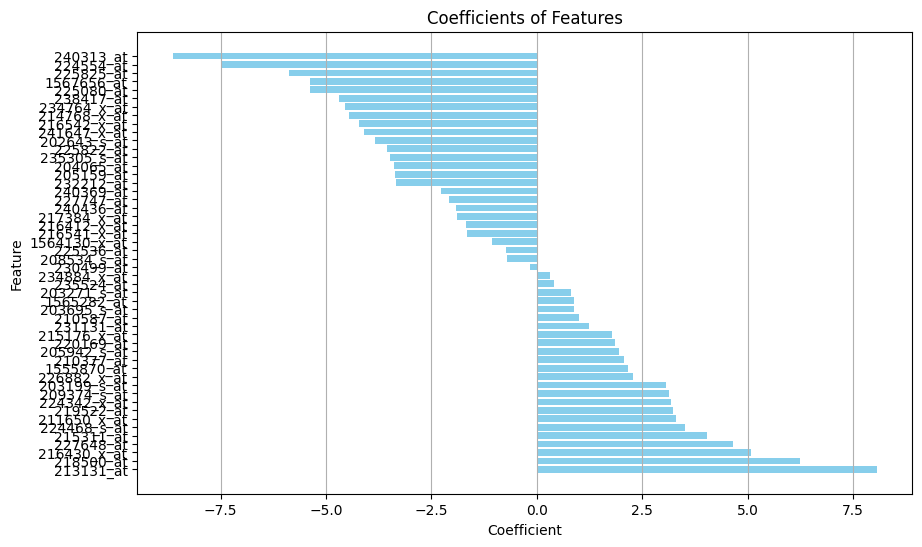

In [184]:
from matplotlib import pyplot as plt


coef_df = pd.DataFrame({'Feature': svc_selected_features_rfe, 'Coefficient': clf.coef_[0]})

# Ordinare il DataFrame per coefficienti
coef_df = coef_df.sort_values(by='Coefficient', ascending=False)

# Creare un grafico a barre dei coefficienti
plt.figure(figsize=(10, 6))
plt.barh(coef_df['Feature'], coef_df['Coefficient'], color='skyblue')
plt.xlabel('Coefficient')
plt.ylabel('Feature')
plt.title('Coefficients of Features')
plt.grid(axis='x')
plt.show()

## Selector RFE con Logistic Regression 
As suggested from Professor


In [185]:
# Implementing another selector but now based on Logistic Regression
from sklearn.linear_model import LogisticRegression

log_reg_selector_log_regr = RFE(LogisticRegression(), n_features_to_select=50)
log_reg_selector_log_regr = log_reg_selector_log_regr.fit(X, y)

log_reg_selected_features_mask = log_reg_selector_log_regr.support_

# Get the names or indices of the selected features
log_reg_selected_features_indices = [i for i, selected in enumerate(log_reg_selected_features_mask) if selected]
log_reg_selected_features_rfe = [selected_features[i] for i in log_reg_selected_features_indices]


In [209]:
X = gene_expression_data[log_reg_selected_features_rfe]
y = gene_expression_data['state']

X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, stratify=y, random_state=243)
X_validation, X_test, y_validation, y_test = train_test_split(X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=78)


clf = SVC(kernel='linear', C = 30)
clf.fit(X, y)
y_pred_validation = clf.predict(X_validation)

print(classification_report(y_validation, y_pred_validation))
print(confusion_matrix(y_validation, y_pred_validation))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        64
           1       1.00      1.00      1.00         8

    accuracy                           1.00        72
   macro avg       1.00      1.00      1.00        72
weighted avg       1.00      1.00      1.00        72

[[64  0]
 [ 0  8]]


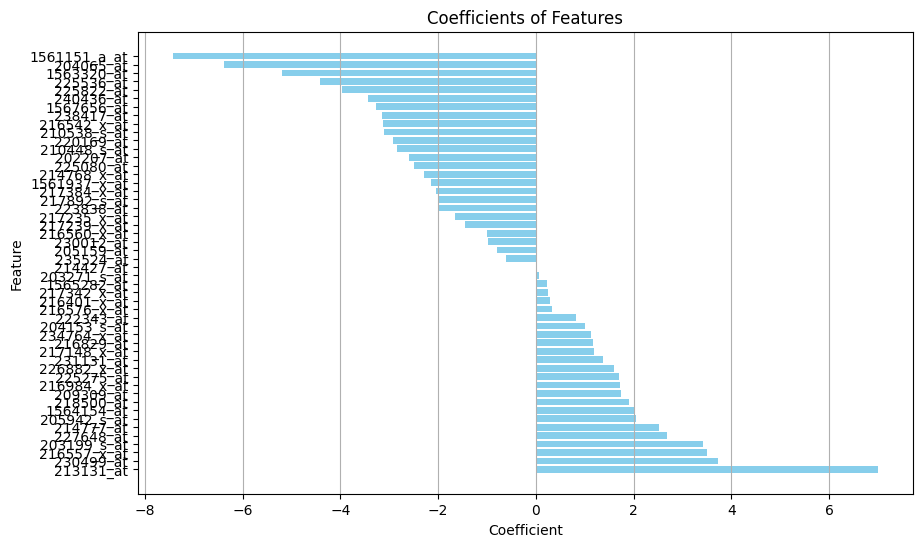

In [187]:
# Creare un DataFrame per i coefficienti delle feature
coef_df = pd.DataFrame({'Feature': log_reg_selected_features_rfe, 'Coefficient': clf.coef_[0]})

# Ordinare il DataFrame per coefficienti
coef_df = coef_df.sort_values(by='Coefficient', ascending=False)

# Creare un grafico a barre dei coefficienti
plt.figure(figsize=(10, 6))
plt.barh(coef_df['Feature'], coef_df['Coefficient'], color='skyblue')
plt.xlabel('Coefficient')
plt.ylabel('Feature')
plt.title('Coefficients of Features')
plt.grid(axis='x')
plt.show()


## Esplorazione features selezionate con mrmr e rfe

In [188]:
intersection = set(log_reg_selected_features_rfe).intersection(set(svc_selected_features_rfe))

In [189]:
len(intersection)

24

In [222]:
X = gene_expression_data[list(intersection)]
y = gene_expression_data['state']

X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, stratify=y, random_state=11)
X_validation, X_test, y_validation, y_test = train_test_split(X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=87)


clf = SVC(kernel='linear', C = 100)
clf.fit(X, y)
y_pred_validation = clf.predict(X_validation)

print(classification_report(y_validation, y_pred_validation))
print(confusion_matrix(y_validation, y_pred_validation))

              precision    recall  f1-score   support

           0       0.90      0.98      0.94        64
           1       0.50      0.12      0.20         8

    accuracy                           0.89        72
   macro avg       0.70      0.55      0.57        72
weighted avg       0.86      0.89      0.86        72

[[63  1]
 [ 7  1]]


In [191]:
with open('probe_genes.txt', 'r') as f:
    probe_genes = f.read().split('\n')

In [192]:
intersection_probe = set(probe_genes).intersection(set(svc_selected_features_rfe))

In [193]:
len(intersection_probe)

5

## Features estrette con svc

In [194]:
X = gene_expression_data[svc_selected_features_rfe]

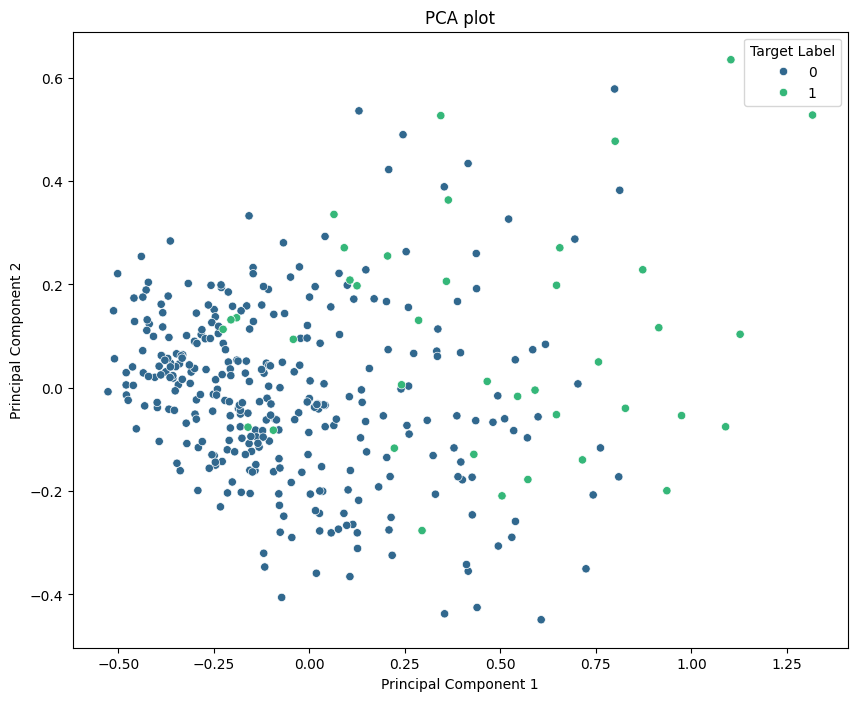

In [206]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Esegui la PCA
pca = PCA(n_components=10)  # Scegli il numero di componenti principali da mantenere
X_pca = pca.fit_transform(X)  # X è il tuo dataset di features

# Aggiungi la label target come colore per la visualizzazione
plt.figure(figsize=(10, 8))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=y, palette='viridis')
plt.title('PCA plot')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Target Label')
plt.show()


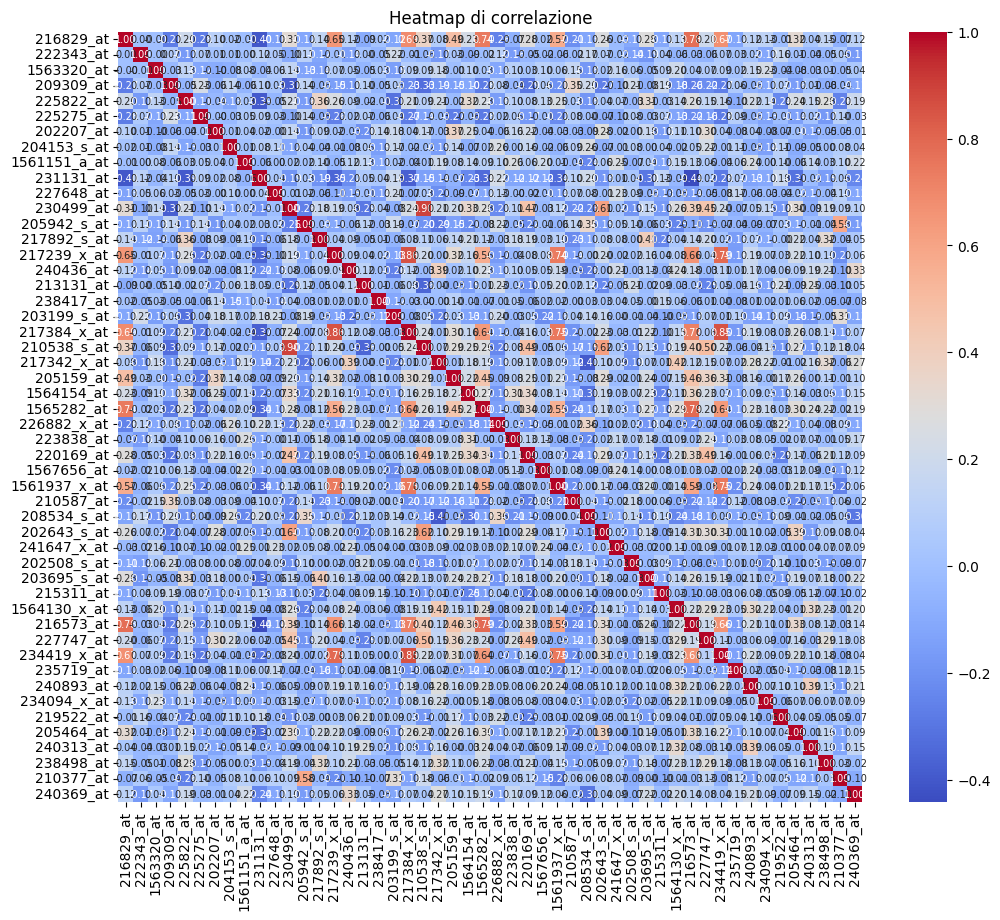

In [142]:
# Get correlation heatmap

corr_0 = X.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 7})
plt.title('Heatmap di correlazione')
plt.show()

In [144]:
X['state'] = y
X_sani, X_malati  = X[X['state']==0], X[X['state']==1]
all_records = X.drop(columns=['state']).values
records_sani = X_sani.drop(columns=['state']).values
records_malati  = X_malati.drop(columns=['state']).values

In [145]:
import matplotlib.pyplot as plt
import numpy as np

def plot_comparison(features_group1, features_group2, feature_names):
    num_features = len(feature_names)
    fig, axs = plt.subplots(num_features, 2, figsize=(24, 6*num_features))

    for i in range(num_features):
        # Boxplot
        axs[i, 0].boxplot([features_group1[:, i], features_group2[:, i]], labels=['Group 1', 'Group 2'])
        axs[i, 0].set_title(feature_names[i] + ' - Boxplot')

        # Kernel Density Estimation (KDE) Plot
        sns.kdeplot(features_group1[:, i], ax=axs[i, 1], label='Group 1', color='blue')
        sns.kdeplot(features_group2[:, i], ax=axs[i, 1], label='Group 2', color='orange')
        axs[i, 1].set_title(feature_names[i] + ' - KDE Plot')
        axs[i, 1].legend()

    plt.tight_layout()
    plt.show()


# Visualizzazione e confronto delle features
plot_comparison(records_sani, records_malati, svc_selected_features_rfe)
 

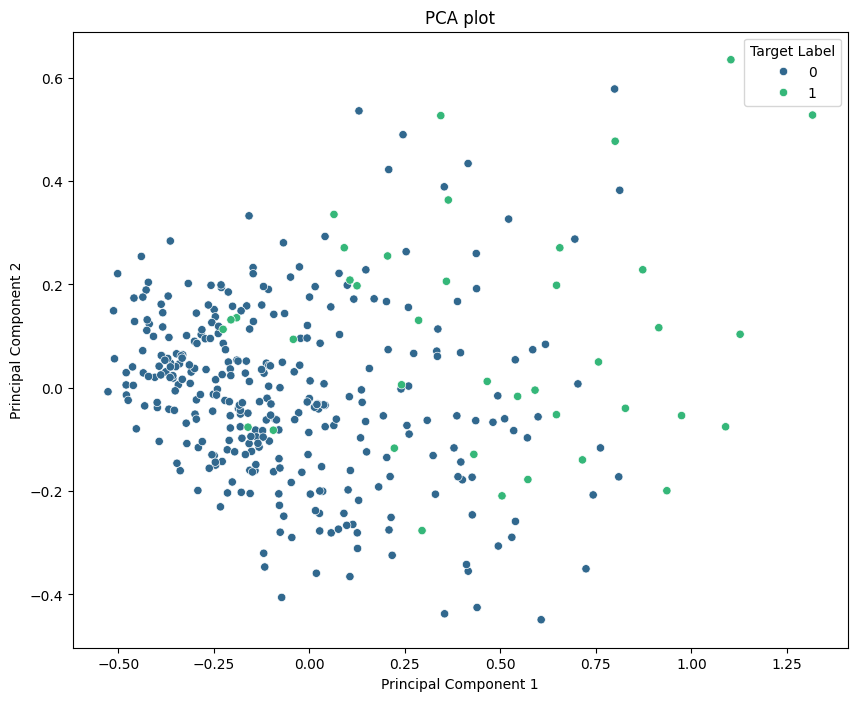

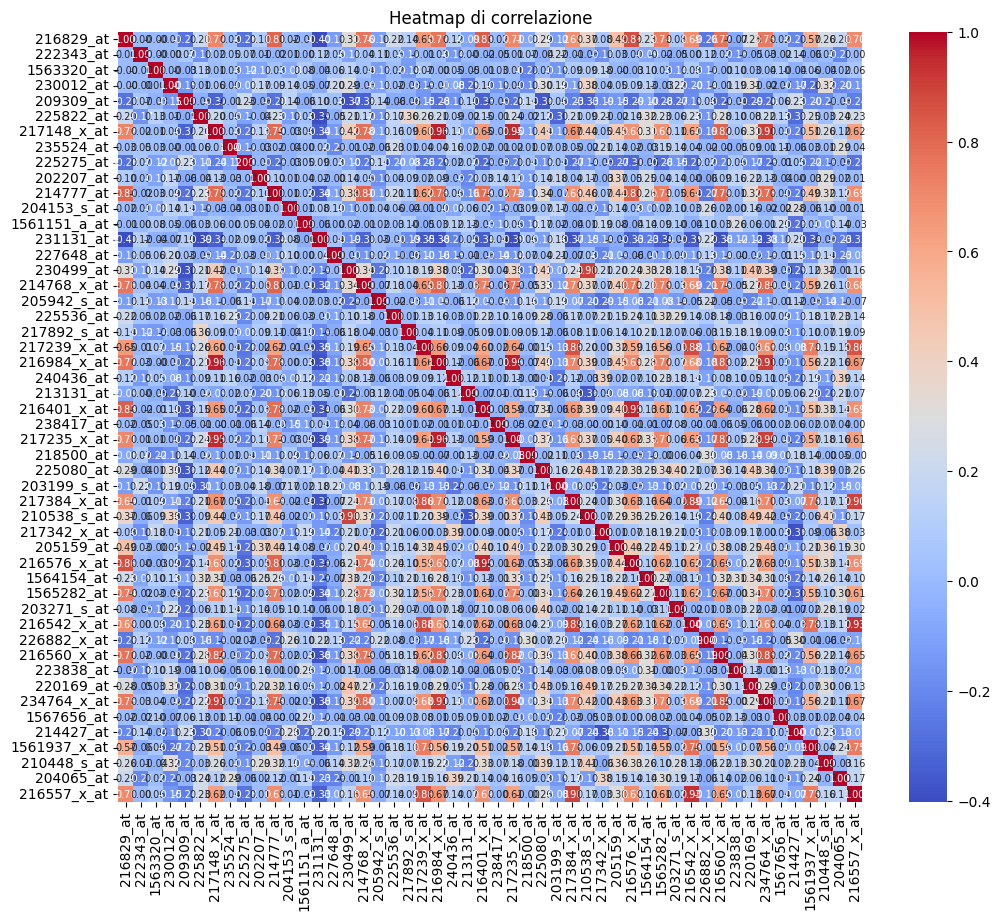

In [196]:
## Features estrette con log reg
X = gene_expression_data[log_reg_selected_features_rfe]
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Esegui la PCA
pca = PCA(n_components=10)  # Scegli il numero di componenti principali da mantenere
X_pca = pca.fit_transform(X)  # X è il tuo dataset di features

# Aggiungi la label target come colore per la visualizzazione
plt.figure(figsize=(10, 8))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=y, palette='viridis')
plt.title('PCA plot')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Target Label')
plt.show()

# Get correlation heatmap

corr_0 = X.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr_0, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 7})
plt.title('Heatmap di correlazione')
plt.show()
X['state'] = y
X_sani, X_malati  = X[X['state']==0], X[X['state']==1]
all_records = X.drop(columns=['state']).values
records_sani = X_sani.drop(columns=['state']).values
records_malati  = X_malati.drop(columns=['state']).values
import matplotlib.pyplot as plt
import numpy as np

def plot_comparison(features_group1, features_group2, feature_names):
    num_features = len(feature_names)
    fig, axs = plt.subplots(num_features, 2, figsize=(24, 6*num_features))

    for i in range(num_features):
        # Boxplot
        axs[i, 0].boxplot([features_group1[:, i], features_group2[:, i]], labels=['Group 1', 'Group 2'])
        axs[i, 0].set_title(feature_names[i] + ' - Boxplot')

        # Kernel Density Estimation (KDE) Plot
        sns.kdeplot(features_group1[:, i], ax=axs[i, 1], label='Group 1', color='blue')
        sns.kdeplot(features_group2[:, i], ax=axs[i, 1], label='Group 2', color='orange')
        axs[i, 1].set_title(feature_names[i] + ' - KDE Plot')
        axs[i, 1].legend()

    plt.tight_layout()
    plt.show()


# Visualizzazione e confronto delle features
plot_comparison(records_sani, records_malati, log_reg_selected_features_rfe)
 


# Decision Tree Experiment